In [1]:
import torch 
from torch import nn 
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
from torchsummary import summary
from torch.optim import AdamW, Adam, RMSprop, Adagrad 
from torchvision.io import read_image, ImageReadMode

import pandas as pd 
from datetime import datetime
import os 
import cv2
from PIL import Image, UnidentifiedImageError
import numpy as np
from skimage.color import rgb2lab, lab2rgb
import matplotlib.pyplot as plt
from tqdm import tqdm 

from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr


In [16]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [17]:
device

'cpu'

In [4]:
class CustomDataset(Dataset):
    def __init__(self, data, transformer=None):
        self.data = data
        self.data_list = sorted(os.listdir(self.data))
        self.transformer=transformer
    def __len__(self):
        return len(self.data_list)
    def __getitem__(self, idx):
        img = os.path.join(self.data, self.data_list[idx])
        img = Image.open(img).convert("RGB")
        
        if self.transformer:
            img = self.transformer(img)

        image = img.permute(1, 2, 0).numpy()
        # print(image.shape)
        image = rgb2lab(image)

        L = image[:, :, 0] / 100.0
        AB = image[:, :, 1:] / 128.0

        L = torch.tensor(L, dtype=torch.float32).unsqueeze(0)
        AB = torch.tensor(AB, dtype=torch.float32).permute(2, 0, 1)

        return L, AB

In [5]:
transformer = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
    
])

data = "/kaggle/input/historical-photos-7/data_05"
dataset = CustomDataset(data, transformer=transformer)

In [6]:
train_data, val_data = random_split(dataset, [0.9, 0.1])

In [8]:
x, y = train_data[0]
x.shape, y.shape

(torch.Size([1, 256, 256]), torch.Size([2, 256, 256]))

In [9]:
def output(data, limit):
    for i, (x, y) in enumerate(data):
    
        X = x.permute(1, 2, 0)
    
        L = x.permute(1, 2, 0).squeeze(2).cpu().numpy()
        AB = y.permute(1, 2, 0).cpu().numpy()
    
        A = AB[:, :, 0]
        B = AB[:, :, 1]
    
        L = np.clip(L*100, 0, 100).astype(np.uint8)
        A = np.clip(A*128, -128, 127).astype(np.int8)
        B = np.clip(B*128, -128, 127).astype(np.int8)
    
        # print(L.shape, A.shape, B.shape)
        lab_image = np.stack([L, A, B], axis=-1).astype(np.float32)
    
        rgb_image = lab2rgb(lab_image)
        rgb_image = np.clip(rgb_image, 0, 1)
        
        plt.figure(figsize=(10, 6))
        
    
        plt.subplot(1, 3, 1)
        plt.title("Grayscaled image")
        plt.imshow(X)
        
    
        plt.subplot(1, 3, 2)
        plt.title("RGB image")
        plt.imshow(rgb_image)
    
        plt.subplot(1, 3, 3)
        plt.title("LAB image")
        plt.imshow(lab_image)
        
        plt.show()
        
        if i+1 >= limit:
            break 

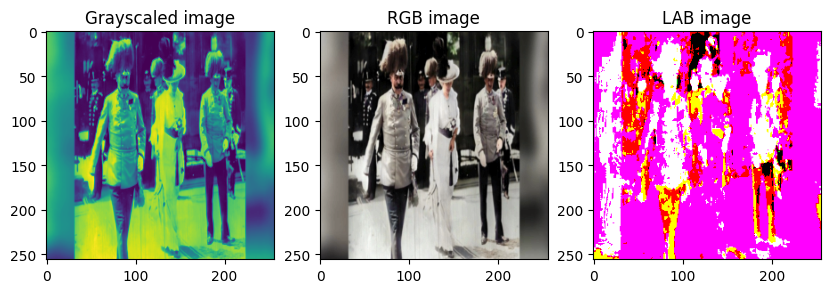

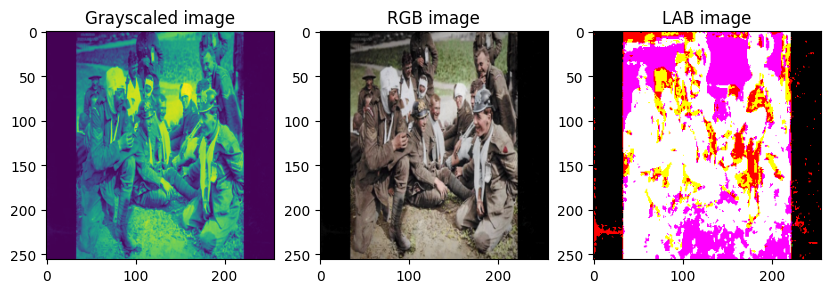

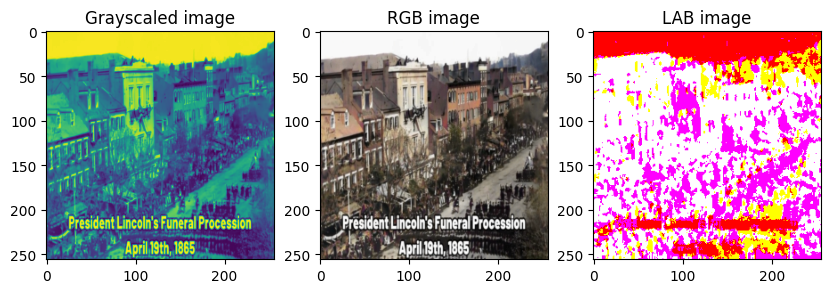

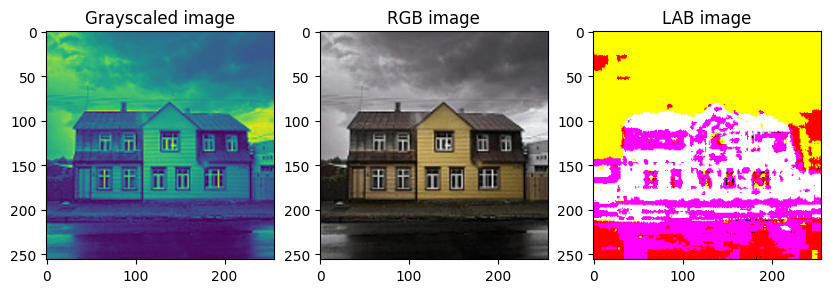

In [35]:
output(train_data, 4)

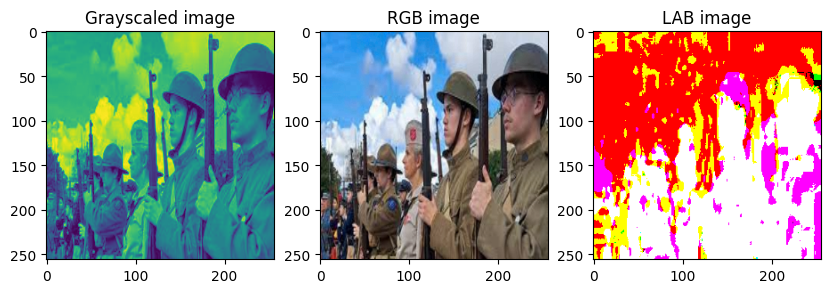

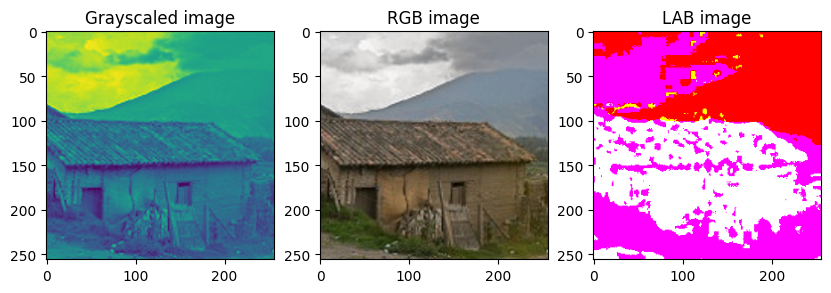

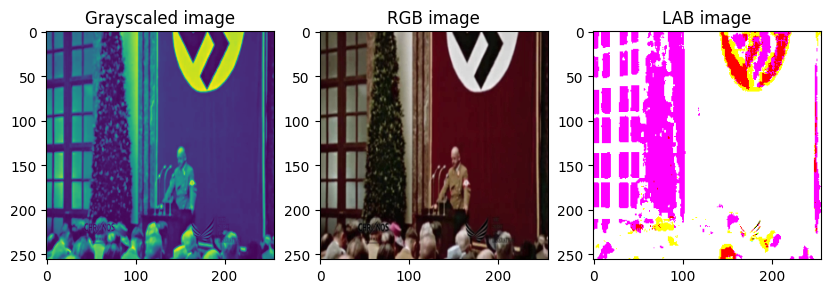

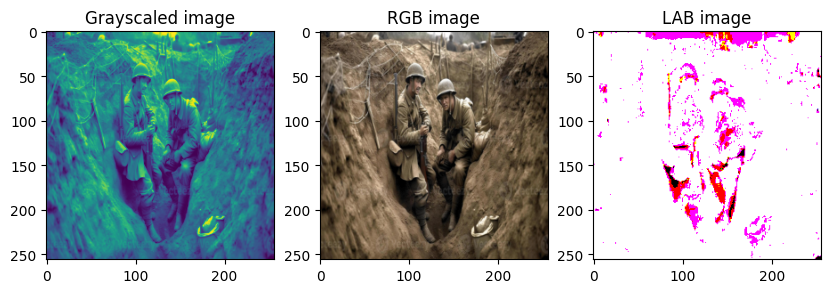

In [36]:
output(val_data, 4)

In [10]:
batch_size = 64
train_dl = DataLoader(train_data, batch_size=batch_size, shuffle=True, generator=torch.Generator(device="cpu"))
val_dl = DataLoader(val_data, batch_size=batch_size, shuffle=True, generator=torch.Generator(device="cpu"))

In [38]:
x, y = next(iter(train_dl))
print(x.shape, y.shape)

torch.Size([64, 1, 256, 256]) torch.Size([64, 2, 256, 256])


In [39]:
x, y = next(iter(val_dl))
print(x.shape, y.shape)

torch.Size([64, 1, 256, 256]) torch.Size([64, 2, 256, 256])


In [11]:
class SEBLock(nn.Module):
    def __init__(self, C, r=16):
        super().__init__()

        self.aap = nn.AdaptiveAvgPool2d((1, 1))
        self.flatten = nn.Flatten()

        self.linear1 = nn.Linear(C, C//r)
        self.linear2 = nn.Linear(C//r, C)

        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        out = self.aap(x)
        out = self.flatten(out)

        out = self.linear1(out)
        out = self.relu(out)

        out = self.linear2(out)
        out = self.sigmoid(out)

        out = out[:, :, None, None]

        res = out * x

        return res 

In [12]:
tensor = torch.rand(1, 32, 256, 256)
block = SEBLock(32)

out = block(tensor)
out.shape

torch.Size([1, 32, 256, 256])

In [15]:
# 1st version 

class NewColorized(nn.Module):
    def __init__(self, inputs=1, outputs=2):
        super().__init__()

        self.conv1 = nn.Conv2d(inputs, 32, kernel_size=4, stride=2, padding=1)
        self.bnorm1 = nn.BatchNorm2d(32)
        self.seblock1 = SEBLock(32)
        
        self.conv2 = nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1)
        self.bnorm2 = nn.BatchNorm2d(64)
        self.seblock2 = SEBLock(64)

        self.conv3 = nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1)
        self.bnorm3 = nn.BatchNorm2d(128)
        self.seblock3 = SEBLock(128)

        self.conv4 = nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1)
        self.bnorm4 = nn.BatchNorm2d(256)
        self.seblock4 = SEBLock(256)

        self.btn_conv5 = nn.Conv2d(256, 512, kernel_size=4, stride=1, padding=3, dilation=2)
        self.bnorm5 = nn.BatchNorm2d(512)
        self.seblock5 = SEBLock(512)
  
        self.btn_conv6 = nn.Conv2d(512, 256, kernel_size=4, stride=1, padding=3, dilation=2)
        self.bnorm6 = nn.BatchNorm2d(256)
        self.seblock6 = SEBLock(256)

    
        self.t_conv1 = nn.ConvTranspose2d(512, 128, kernel_size=4, stride=2, padding=1)
        self.t_bnorm1 = nn.BatchNorm2d(128)
        self.seblock7 = SEBLock(128)

        self.t_conv2 = nn.ConvTranspose2d(256, 64, kernel_size=4, stride=2, padding=1)
        self.t_bnorm2 = nn.BatchNorm2d(64)
        self.seblock8 = SEBLock(64)

        self.t_conv3 = nn.ConvTranspose2d(128, 32, kernel_size=4, stride=2, padding=1)
        self.t_bnorm3 = nn.BatchNorm2d(32)
        self.seblock9 = SEBLock(32)

        self.t_conv4 = nn.ConvTranspose2d(64, 2, kernel_size=4, stride=2, padding=1)


        self.t_conv5 = nn.Conv2d(3, outputs, kernel_size=3, padding=1)

    def forward(self, x, return_latent=False):
        # print(x.shape)
        
        x1 = F.leaky_relu(self.bnorm1(self.conv1(x)))
        x1 = self.seblock1(x1)
        # print(x1.shape)

        x2 = F.leaky_relu(self.bnorm2(self.conv2(x1)))
        x2 = self.seblock2(x2)
        # print(x2.shape)

        x3 = F.leaky_relu(self.bnorm3(self.conv3(x2)))
        x3 = self.seblock3(x3)
        # print(x3.shape)

        x4 = F.leaky_relu(self.bnorm4(self.conv4(x3)))
        x4 = self.seblock4(x4)
        # print(x4.shape)

        x5 = F.leaky_relu(self.bnorm5(self.btn_conv5(x4)))
        x5 = self.seblock5(x5)
        # print(x5.shape)

        if return_latent == True:
            return x5

        x6 = F.leaky_relu(self.bnorm6(self.btn_conv6(x5)))
        x6 = self.seblock6(x6)
        # print(x6.shape)

        x7 = torch.cat((x6, x4), 1)
        # print(x7.shape)

        x8 = F.leaky_relu(self.t_bnorm1(self.t_conv1(x7)))
        x8 = self.seblock7(x8)
        # print(x8.shape)

        x9 = torch.cat((x8, x3), 1)
        # print(x9.shape)

        x10 = F.leaky_relu(self.t_bnorm2(self.t_conv2(x9)))
        x10 = self.seblock8(x10)
        # print(x10.shape)

        x11 = torch.cat((x10, x2), 1)
        # print(x11.shape)

        x12 = F.leaky_relu(self.t_bnorm3(self.t_conv3(x11)))
        x12 = self.seblock9(x12)
        # print(x12.shape)

        x13 = torch.cat((x12, x1), 1)
        # print(x13.shape)

        x14 = F.leaky_relu(self.t_conv4(x13))
        # print(x14.shape)

        x15 = torch.cat((x14, x), 1)
        # print(x15.shape)

        x16 = F.tanh(self.t_conv5(x15))
        # print(x16.shape)

        return x16
    
    
    def predict(self, l_channel):
        self.eval()
        
        with torch.no_grad():
            ab_channels = self.forward(l_channel)
            
        # print("Shape of output from model:", ab_channels.shape)
        # print("Min/Max values in ab_channels (before scaling):", ab_channels.min().item(), ab_channels.max().item())
        
        l_channel = l_channel.squeeze(0).cpu().numpy()
        a_channel = ab_channels[:, 0, :, :].cpu().numpy()
        b_channel = ab_channels[:, 1, :, :].cpu().numpy()
        
        # print("Min/Max a_channel (after extraction):", a_channel.min(), a_channel.max())
        # print("Min/Max b_channel (after extraction):", b_channel.min(), b_channel.max())
        
        # Масштабируем значения
        l_channel = np.clip(l_channel * 100, 0, 100).astype(np.uint8)
        a_channel = np.clip(a_channel * 128, -128, 127).astype(np.int8)
        b_channel = np.clip(b_channel * 128, -128, 127).astype(np.int8)

        
        lab_img = np.stack([l_channel, a_channel, b_channel], axis=-1).astype(np.float64)
        rgb_image = lab2rgb(lab_img)

        rgb_image = (rgb_image * 255).astype(np.uint8)
        
        return rgb_image

        
    
model = NewColorized()
model.to(device)

NewColorized(
  (conv1): Conv2d(1, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (bnorm1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (seblock1): SEBLock(
    (aap): AdaptiveAvgPool2d(output_size=(1, 1))
    (flatten): Flatten(start_dim=1, end_dim=-1)
    (linear1): Linear(in_features=32, out_features=2, bias=True)
    (linear2): Linear(in_features=2, out_features=32, bias=True)
    (relu): ReLU()
    (sigmoid): Sigmoid()
  )
  (conv2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (bnorm2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (seblock2): SEBLock(
    (aap): AdaptiveAvgPool2d(output_size=(1, 1))
    (flatten): Flatten(start_dim=1, end_dim=-1)
    (linear1): Linear(in_features=64, out_features=4, bias=True)
    (linear2): Linear(in_features=4, out_features=64, bias=True)
    (relu): ReLU()
    (sigmoid): Sigmoid()
  )
  (conv3): Conv2d(64, 128, kernel_size=(4, 4), stride

In [17]:
tensor = torch.rand(1, 1, 256, 256).to(device)
res = model(tensor, return_latent=True)
res.shape

torch.Size([1, 512, 16, 16])

In [18]:
model.load_state_dict(torch.load("/kaggle/input/weights-9/history_in_color_v09.pt", map_location=device))

<ipython-input-18-a67261619d79>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("/kaggle/input/weights-9/history_in_color_v09.pt", map_loca

<All keys matched successfully>

In [19]:
summary(model, input_size=(1, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 128, 128]             544
       BatchNorm2d-2         [-1, 32, 128, 128]              64
 AdaptiveAvgPool2d-3             [-1, 32, 1, 1]               0
           Flatten-4                   [-1, 32]               0
            Linear-5                    [-1, 2]              66
              ReLU-6                    [-1, 2]               0
            Linear-7                   [-1, 32]              96
           Sigmoid-8                   [-1, 32]               0
           SEBLock-9         [-1, 32, 128, 128]               0
           Conv2d-10           [-1, 64, 64, 64]          32,832
      BatchNorm2d-11           [-1, 64, 64, 64]             128
AdaptiveAvgPool2d-12             [-1, 64, 1, 1]               0
          Flatten-13                   [-1, 64]               0
           Linear-14                   

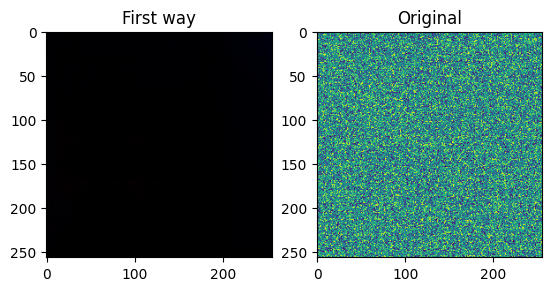

In [20]:
# model = NewColorized()
model.to(device)
tensor = torch.rand(1, 1, 256, 256).to(device)


tensor = tensor[:, 0, :, :] / 100.0
tensor = tensor.unsqueeze(0)
tensor.shape

res = model.predict(tensor)
res = res.squeeze(0)


t_tensor = tensor.squeeze(0).permute(1, 2, 0).cpu().numpy()


plt.subplot(1, 2, 1)
plt.imshow(res)
plt.title("First way")


plt.subplot(1, 2, 2)
plt.imshow(t_tensor)
plt.title("Original")

plt.show()



In [21]:
def train(model, train_dl, val_dl, loss_fn, psnr, ssim, optimizer, epochs, device):
    history = {
        "train_loss": [],
        "val_loss": [],
        
        "train_psnr": [],
        "val_psnr": [],
        
        "train_ssim": [],
        "val_ssim": []
    }

    for epoch in range(epochs):
        model.train()
        
        train_loss = 0.0
        train_psnr = 0.0
        train_ssim = 0.0

        for x, y in tqdm(train_dl):
            x = x.to(device)
            y = y.to(device)

            optimizer.zero_grad()

            preds = model(x)

            loss = loss_fn(y, preds)
            train_loss += loss.item()
            loss.backward()
            optimizer.step()

            t_psnr = psnr(preds.detach().cpu().numpy(), y.detach().cpu().numpy(), data_range=2.0)
            train_psnr += t_psnr

            preds_np = preds.cpu().detach().numpy()
            y_np = y.cpu().detach().numpy()

            if preds_np.shape[1] > 1:  
                preds_np = preds_np.mean(axis=1) 
                y_np = y_np.mean(axis=1)

            t_ssim = ssim(preds_np.squeeze(), y_np.squeeze(), win_size=7, data_range=2.0)
            train_ssim += t_ssim

        total_train_loss = train_loss / len(train_dl)
        total_train_psnr = train_psnr / len(train_dl)
        total_train_ssim = train_ssim / len(train_dl)

        model.eval()
        
        val_loss = 0.0
        val_psnr = 0.0
        val_ssim = 0.0
        
        for x, y in tqdm(val_dl):
            with torch.no_grad():
                x = x.to(device)
                y = y.to(device)

                preds = model(x)

                loss = loss_fn(preds, y)
                val_loss += loss.item()

                t_psnr = psnr(preds.detach().cpu().numpy(), y.detach().cpu().numpy(), data_range=2.0)
                val_psnr += t_psnr

                preds_np = preds.cpu().detach().numpy()
                y_np = y.cpu().detach().numpy()

                if preds_np.shape[1] > 1:  
                    preds_np = preds_np.mean(axis=1) 
                    y_np = y_np.mean(axis=1)
    
                t_ssim = ssim(preds_np.squeeze(), y_np.squeeze(), win_size=7, data_range=2.0)
                val_ssim += t_ssim

        total_val_loss = val_loss / len(val_dl)
        total_val_psnr = val_psnr / len(val_dl)
        total_val_ssim = val_ssim / len(val_dl)

        history["train_loss"].append(total_train_loss)
        history["train_psnr"].append(total_train_psnr)
        history["train_ssim"].append(total_train_ssim)

        history["val_loss"].append(total_val_loss)
        history["val_psnr"].append(total_val_psnr)
        history["val_ssim"].append(total_val_ssim)

        print(
            f"Epoch: {epoch+1}; "
            f"train_loss: {total_train_loss:.4f}; train_psnr: {total_train_psnr:.4f}; train_ssim: {total_train_ssim:.4f}; "
            f"val_loss: {total_val_loss:.4f}; val_psnr: {total_val_psnr:.4f}; val_ssim: {total_val_ssim:.4f}"
        )

    return history


In [47]:
loss_fn = nn.MSELoss()
optimizer = Adam(model.parameters(), lr=1e-3)

In [48]:
torch.cuda.empty_cache()
history = train(model, train_dl, val_dl, loss_fn, psnr, ssim, optimizer, 60, device)

100%|██████████| 20/20 [00:52<00:00,  2.62s/it]


Epoch: 1; train_loss: 0.0083; train_psnr: 27.4220; train_ssim: 0.4680; val_loss: 0.0061; val_psnr: 28.1899; val_ssim: 0.5347


100%|██████████| 20/20 [00:38<00:00,  1.93s/it]


Epoch: 2; train_loss: 0.0057; train_psnr: 28.5252; train_ssim: 0.5581; val_loss: 0.0056; val_psnr: 28.5573; val_ssim: 0.5593


100%|██████████| 20/20 [00:41<00:00,  2.08s/it]


Epoch: 3; train_loss: 0.0053; train_psnr: 28.8539; train_ssim: 0.5849; val_loss: 0.0051; val_psnr: 28.9911; val_ssim: 0.6052


100%|██████████| 20/20 [00:37<00:00,  1.85s/it]


Epoch: 4; train_loss: 0.0049; train_psnr: 29.1921; train_ssim: 0.6090; val_loss: 0.0047; val_psnr: 29.3113; val_ssim: 0.6272


100%|██████████| 20/20 [00:36<00:00,  1.82s/it]


Epoch: 5; train_loss: 0.0046; train_psnr: 29.4870; train_ssim: 0.6290; val_loss: 0.0044; val_psnr: 29.6093; val_ssim: 0.6417


100%|██████████| 20/20 [00:37<00:00,  1.88s/it]


Epoch: 6; train_loss: 0.0043; train_psnr: 29.6847; train_ssim: 0.6447; val_loss: 0.0043; val_psnr: 29.7434; val_ssim: 0.6593


100%|██████████| 20/20 [00:37<00:00,  1.88s/it]


Epoch: 7; train_loss: 0.0041; train_psnr: 29.9710; train_ssim: 0.6674; val_loss: 0.0049; val_psnr: 29.1686; val_ssim: 0.5186


100%|██████████| 20/20 [00:37<00:00,  1.86s/it]


Epoch: 8; train_loss: 0.0039; train_psnr: 30.1165; train_ssim: 0.6765; val_loss: 0.0045; val_psnr: 29.5078; val_ssim: 0.5954


100%|██████████| 20/20 [00:39<00:00,  1.97s/it]


Epoch: 9; train_loss: 0.0037; train_psnr: 30.3634; train_ssim: 0.6906; val_loss: 0.0039; val_psnr: 30.2025; val_ssim: 0.6582


100%|██████████| 20/20 [00:36<00:00,  1.81s/it]


Epoch: 10; train_loss: 0.0036; train_psnr: 30.5720; train_ssim: 0.7053; val_loss: 0.0037; val_psnr: 30.3759; val_ssim: 0.7046


100%|██████████| 20/20 [00:35<00:00,  1.76s/it]


Epoch: 11; train_loss: 0.0033; train_psnr: 30.8323; train_ssim: 0.7240; val_loss: 0.0035; val_psnr: 30.5606; val_ssim: 0.6843


100%|██████████| 20/20 [00:36<00:00,  1.84s/it]


Epoch: 12; train_loss: 0.0030; train_psnr: 31.2415; train_ssim: 0.7343; val_loss: 0.0033; val_psnr: 30.9216; val_ssim: 0.7349


100%|██████████| 20/20 [00:37<00:00,  1.87s/it]


Epoch: 13; train_loss: 0.0028; train_psnr: 31.6303; train_ssim: 0.7490; val_loss: 0.0031; val_psnr: 31.1745; val_ssim: 0.7268


100%|██████████| 20/20 [00:36<00:00,  1.84s/it]


Epoch: 14; train_loss: 0.0026; train_psnr: 31.9227; train_ssim: 0.7582; val_loss: 0.0030; val_psnr: 31.2529; val_ssim: 0.7304


100%|██████████| 20/20 [00:38<00:00,  1.93s/it]


Epoch: 15; train_loss: 0.0024; train_psnr: 32.3298; train_ssim: 0.7798; val_loss: 0.0028; val_psnr: 31.5880; val_ssim: 0.7549


100%|██████████| 20/20 [00:36<00:00,  1.81s/it]


Epoch: 16; train_loss: 0.0022; train_psnr: 32.6363; train_ssim: 0.7855; val_loss: 0.0028; val_psnr: 31.6424; val_ssim: 0.7259


100%|██████████| 20/20 [00:38<00:00,  1.94s/it]


Epoch: 17; train_loss: 0.0020; train_psnr: 32.9758; train_ssim: 0.8010; val_loss: 0.0030; val_psnr: 31.3507; val_ssim: 0.6792


100%|██████████| 20/20 [00:41<00:00,  2.09s/it]


Epoch: 18; train_loss: 0.0018; train_psnr: 33.4579; train_ssim: 0.8188; val_loss: 0.0027; val_psnr: 31.7721; val_ssim: 0.7372


100%|██████████| 20/20 [00:36<00:00,  1.83s/it]


Epoch: 19; train_loss: 0.0017; train_psnr: 33.6722; train_ssim: 0.8259; val_loss: 0.0024; val_psnr: 32.3580; val_ssim: 0.7984


100%|██████████| 20/20 [00:43<00:00,  2.15s/it]


Epoch: 20; train_loss: 0.0016; train_psnr: 33.9779; train_ssim: 0.8375; val_loss: 0.0022; val_psnr: 32.7247; val_ssim: 0.8144


100%|██████████| 20/20 [00:37<00:00,  1.90s/it]


Epoch: 21; train_loss: 0.0015; train_psnr: 34.3165; train_ssim: 0.8474; val_loss: 0.0023; val_psnr: 32.4073; val_ssim: 0.8071


100%|██████████| 20/20 [00:36<00:00,  1.85s/it]


Epoch: 22; train_loss: 0.0014; train_psnr: 34.4505; train_ssim: 0.8499; val_loss: 0.0023; val_psnr: 32.3886; val_ssim: 0.7328


100%|██████████| 20/20 [00:37<00:00,  1.86s/it]


Epoch: 23; train_loss: 0.0014; train_psnr: 34.6999; train_ssim: 0.8611; val_loss: 0.0025; val_psnr: 32.1362; val_ssim: 0.7827


100%|██████████| 20/20 [00:41<00:00,  2.05s/it]


Epoch: 24; train_loss: 0.0013; train_psnr: 34.9104; train_ssim: 0.8623; val_loss: 0.0021; val_psnr: 32.8258; val_ssim: 0.8224


100%|██████████| 20/20 [00:40<00:00,  2.03s/it]


Epoch: 25; train_loss: 0.0012; train_psnr: 35.1816; train_ssim: 0.8768; val_loss: 0.0021; val_psnr: 32.9692; val_ssim: 0.8164


100%|██████████| 20/20 [00:38<00:00,  1.94s/it]


Epoch: 26; train_loss: 0.0012; train_psnr: 35.2880; train_ssim: 0.8754; val_loss: 0.0021; val_psnr: 32.8550; val_ssim: 0.8207


100%|██████████| 20/20 [00:37<00:00,  1.88s/it]


Epoch: 27; train_loss: 0.0011; train_psnr: 35.5771; train_ssim: 0.8823; val_loss: 0.0021; val_psnr: 32.9122; val_ssim: 0.8238


100%|██████████| 20/20 [00:37<00:00,  1.88s/it]


Epoch: 28; train_loss: 0.0011; train_psnr: 35.7682; train_ssim: 0.8871; val_loss: 0.0020; val_psnr: 33.0778; val_ssim: 0.8095


100%|██████████| 20/20 [00:38<00:00,  1.92s/it]


Epoch: 29; train_loss: 0.0010; train_psnr: 35.8750; train_ssim: 0.8931; val_loss: 0.0020; val_psnr: 33.0824; val_ssim: 0.8370


100%|██████████| 20/20 [00:35<00:00,  1.79s/it]


Epoch: 30; train_loss: 0.0010; train_psnr: 35.9355; train_ssim: 0.8924; val_loss: 0.0019; val_psnr: 33.2807; val_ssim: 0.8231


100%|██████████| 20/20 [00:38<00:00,  1.94s/it]


Epoch: 31; train_loss: 0.0010; train_psnr: 36.0899; train_ssim: 0.8952; val_loss: 0.0021; val_psnr: 32.8502; val_ssim: 0.7734


100%|██████████| 20/20 [00:39<00:00,  1.99s/it]


Epoch: 32; train_loss: 0.0010; train_psnr: 36.1574; train_ssim: 0.8936; val_loss: 0.0020; val_psnr: 33.1524; val_ssim: 0.8356


100%|██████████| 20/20 [00:38<00:00,  1.95s/it]


Epoch: 33; train_loss: 0.0009; train_psnr: 36.3773; train_ssim: 0.8997; val_loss: 0.0019; val_psnr: 33.4278; val_ssim: 0.8225


100%|██████████| 20/20 [00:37<00:00,  1.87s/it]


Epoch: 34; train_loss: 0.0009; train_psnr: 36.4940; train_ssim: 0.9072; val_loss: 0.0020; val_psnr: 33.1727; val_ssim: 0.8207


100%|██████████| 20/20 [00:37<00:00,  1.85s/it]


Epoch: 35; train_loss: 0.0009; train_psnr: 36.6929; train_ssim: 0.9084; val_loss: 0.0019; val_psnr: 33.5009; val_ssim: 0.8504


100%|██████████| 20/20 [00:39<00:00,  1.96s/it]


Epoch: 36; train_loss: 0.0009; train_psnr: 36.6518; train_ssim: 0.9045; val_loss: 0.0019; val_psnr: 33.3496; val_ssim: 0.8489


100%|██████████| 20/20 [00:37<00:00,  1.86s/it]


Epoch: 37; train_loss: 0.0009; train_psnr: 36.6338; train_ssim: 0.9065; val_loss: 0.0018; val_psnr: 33.4682; val_ssim: 0.8487


100%|██████████| 20/20 [00:37<00:00,  1.87s/it]


Epoch: 38; train_loss: 0.0008; train_psnr: 36.8925; train_ssim: 0.9095; val_loss: 0.0018; val_psnr: 33.5417; val_ssim: 0.8530


100%|██████████| 20/20 [00:37<00:00,  1.88s/it]


Epoch: 39; train_loss: 0.0008; train_psnr: 36.9358; train_ssim: 0.9105; val_loss: 0.0018; val_psnr: 33.5121; val_ssim: 0.8503


100%|██████████| 20/20 [00:38<00:00,  1.90s/it]


Epoch: 40; train_loss: 0.0008; train_psnr: 36.9045; train_ssim: 0.9091; val_loss: 0.0019; val_psnr: 33.3705; val_ssim: 0.8422


100%|██████████| 20/20 [00:37<00:00,  1.86s/it]


Epoch: 41; train_loss: 0.0008; train_psnr: 37.2818; train_ssim: 0.9189; val_loss: 0.0018; val_psnr: 33.7022; val_ssim: 0.8450


100%|██████████| 20/20 [00:37<00:00,  1.88s/it]


Epoch: 42; train_loss: 0.0007; train_psnr: 37.3573; train_ssim: 0.9243; val_loss: 0.0018; val_psnr: 33.5984; val_ssim: 0.8615


100%|██████████| 20/20 [00:37<00:00,  1.89s/it]


Epoch: 43; train_loss: 0.0007; train_psnr: 37.4001; train_ssim: 0.9240; val_loss: 0.0019; val_psnr: 33.2579; val_ssim: 0.8136


100%|██████████| 20/20 [00:38<00:00,  1.90s/it]


Epoch: 44; train_loss: 0.0007; train_psnr: 37.4396; train_ssim: 0.9239; val_loss: 0.0017; val_psnr: 33.7174; val_ssim: 0.8626


100%|██████████| 20/20 [00:36<00:00,  1.83s/it]


Epoch: 45; train_loss: 0.0007; train_psnr: 37.5309; train_ssim: 0.9235; val_loss: 0.0018; val_psnr: 33.7334; val_ssim: 0.8486


100%|██████████| 20/20 [00:37<00:00,  1.87s/it]


Epoch: 46; train_loss: 0.0007; train_psnr: 37.5178; train_ssim: 0.9231; val_loss: 0.0019; val_psnr: 33.4752; val_ssim: 0.8353


100%|██████████| 20/20 [00:38<00:00,  1.90s/it]


Epoch: 47; train_loss: 0.0007; train_psnr: 37.5636; train_ssim: 0.9261; val_loss: 0.0017; val_psnr: 33.7787; val_ssim: 0.8427


100%|██████████| 20/20 [00:36<00:00,  1.83s/it]


Epoch: 48; train_loss: 0.0007; train_psnr: 37.7663; train_ssim: 0.9263; val_loss: 0.0018; val_psnr: 33.5860; val_ssim: 0.8533


100%|██████████| 20/20 [00:36<00:00,  1.84s/it]


Epoch: 49; train_loss: 0.0007; train_psnr: 37.8520; train_ssim: 0.9292; val_loss: 0.0017; val_psnr: 33.9070; val_ssim: 0.8634


100%|██████████| 20/20 [00:36<00:00,  1.83s/it]


Epoch: 50; train_loss: 0.0007; train_psnr: 37.8097; train_ssim: 0.9233; val_loss: 0.0017; val_psnr: 33.8511; val_ssim: 0.8599


100%|██████████| 20/20 [00:38<00:00,  1.92s/it]


Epoch: 51; train_loss: 0.0006; train_psnr: 37.9635; train_ssim: 0.9292; val_loss: 0.0018; val_psnr: 33.7037; val_ssim: 0.8546


100%|██████████| 20/20 [00:36<00:00,  1.82s/it]


Epoch: 52; train_loss: 0.0006; train_psnr: 37.9786; train_ssim: 0.9312; val_loss: 0.0017; val_psnr: 33.8101; val_ssim: 0.8449


100%|██████████| 20/20 [00:36<00:00,  1.82s/it]


Epoch: 53; train_loss: 0.0006; train_psnr: 38.0606; train_ssim: 0.9311; val_loss: 0.0017; val_psnr: 33.9312; val_ssim: 0.8656


100%|██████████| 20/20 [00:36<00:00,  1.84s/it]


Epoch: 54; train_loss: 0.0006; train_psnr: 38.2195; train_ssim: 0.9371; val_loss: 0.0017; val_psnr: 33.7920; val_ssim: 0.8610


100%|██████████| 20/20 [00:35<00:00,  1.79s/it]


Epoch: 55; train_loss: 0.0006; train_psnr: 38.1512; train_ssim: 0.9332; val_loss: 0.0017; val_psnr: 33.9128; val_ssim: 0.8639


100%|██████████| 20/20 [00:36<00:00,  1.81s/it]


Epoch: 56; train_loss: 0.0006; train_psnr: 38.2706; train_ssim: 0.9381; val_loss: 0.0016; val_psnr: 33.9850; val_ssim: 0.8695


100%|██████████| 20/20 [00:36<00:00,  1.85s/it]


Epoch: 57; train_loss: 0.0006; train_psnr: 38.3494; train_ssim: 0.9374; val_loss: 0.0017; val_psnr: 33.8671; val_ssim: 0.8629


100%|██████████| 20/20 [00:36<00:00,  1.81s/it]


Epoch: 58; train_loss: 0.0006; train_psnr: 38.2940; train_ssim: 0.9322; val_loss: 0.0018; val_psnr: 33.7402; val_ssim: 0.8095


100%|██████████| 20/20 [00:43<00:00,  2.19s/it]


Epoch: 59; train_loss: 0.0006; train_psnr: 38.2679; train_ssim: 0.9345; val_loss: 0.0017; val_psnr: 33.9731; val_ssim: 0.8673


100%|██████████| 20/20 [00:37<00:00,  1.88s/it]

Epoch: 60; train_loss: 0.0006; train_psnr: 38.5082; train_ssim: 0.9409; val_loss: 0.0018; val_psnr: 33.7084; val_ssim: 0.8563


In [83]:
def output(history, metric):
    plt.plot(history[f"train_{metric}"], label="train set")
    plt.plot(history[f"val_{metric}"], label="validation set")
    plt.xlabel("Epochs")
    plt.ylabel(metric)
    plt.legend()
    plt.show()

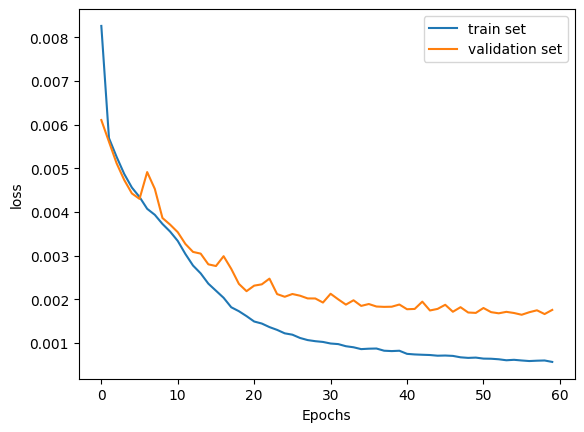

In [58]:
output(history, "loss")

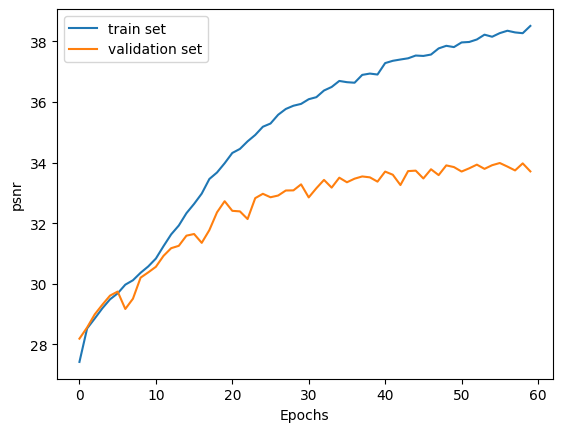

In [59]:
output(history, "psnr")

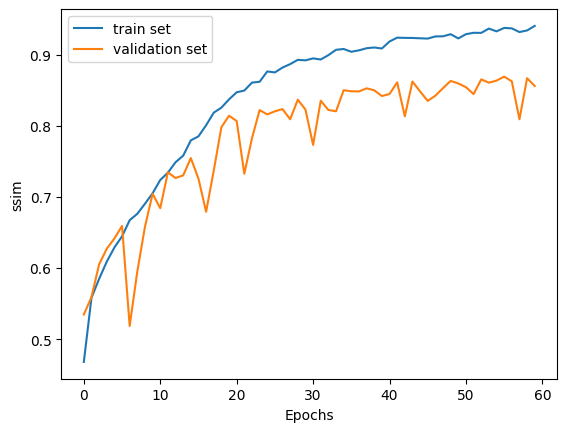

In [60]:
output(history, "ssim")

torch.Size([3, 256, 256])
torch.Size([1, 1, 256, 256])


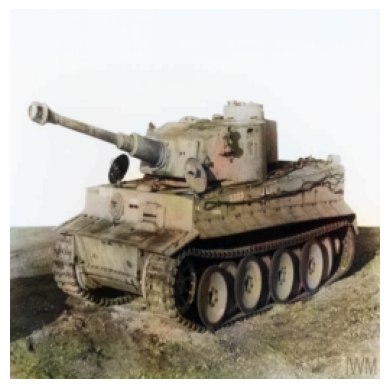

In [22]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])




img = '/kaggle/input/testing-history-images/test_data /24_image.jpg'
image = Image.open(img).convert("RGB")
image = transform(image) 
print(image.shape)


image = image.permute(1, 2, 0).cpu().numpy()
image = rgb2lab(image)
L = image[:, :, 0] / 100.0

L = torch.tensor(L, dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(device)

print(L.shape)
res = model.predict(L)
res = res.squeeze(0)

plt.imshow(res)
plt.axis('off')
plt.show()


In [74]:
def output_images(dataset, model, limit):
    for i, (x, y) in enumerate(dataset):
        L = x.unsqueeze(0).to(device)
        l_channel = x.permute(1, 2, 0).squeeze(2).cpu().numpy()
        ab_channels = y.permute(1, 2, 0).cpu().numpy()
    
        a_channel = ab_channels[:, :, 0]
        b_channel = ab_channels[:, :, 1]
    
        # print(l_channel.shape, a_channel.shape, b_channel.shape)
        lab_image = np.stack([l_channel*100, a_channel*128, b_channel*128], axis=-1).astype(np.float64)
        rgb_image = lab2rgb(lab_image)
        
        res = model.predict(L)
        # print(L.shape)

        if len(res.shape) > 3:
            res = res.squeeze(0)
        
        plt.subplot(1, 3, 1)
        plt.imshow(res)
        plt.title("Prediction")    
        
        plt.subplot(1, 3, 2)
        plt.imshow(l_channel, cmap="gray")
        plt.title("Grayscaled")
    
        plt.subplot(1, 3, 3)
        plt.imshow(rgb_image)
        plt.title("Original")
        
        plt.show()
    
        if i+1 >= limit:
            break 



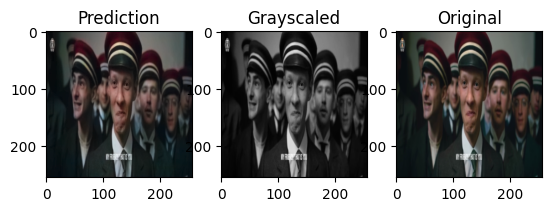

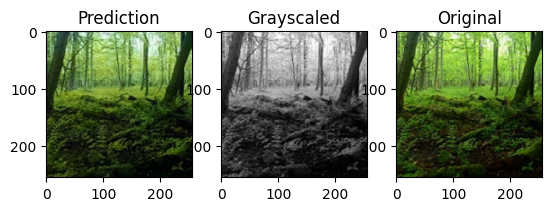

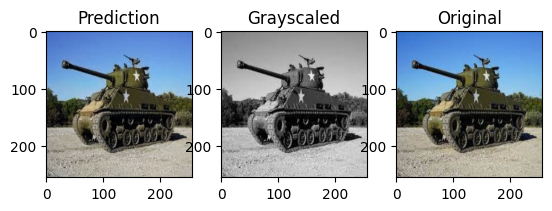

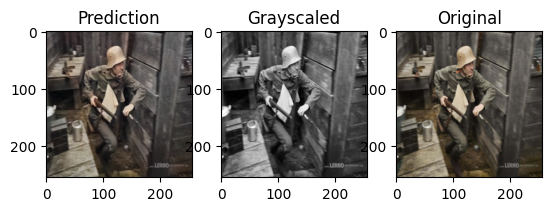

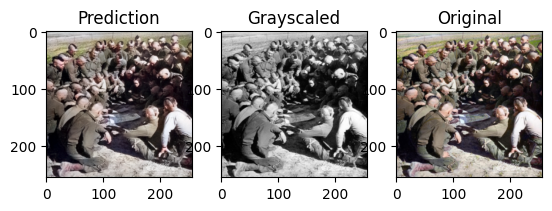

...

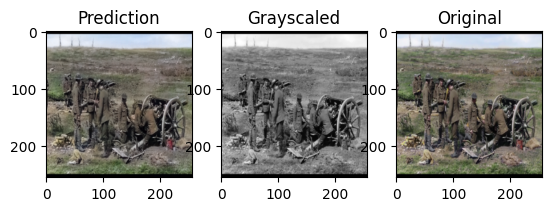

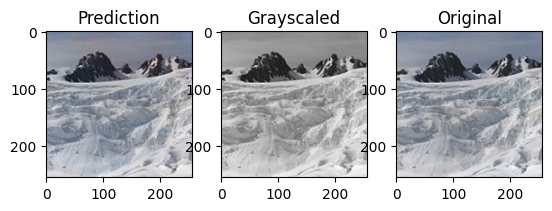

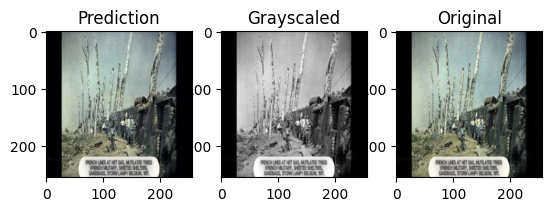

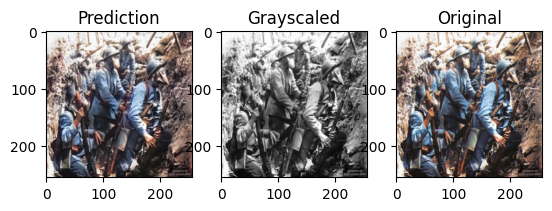

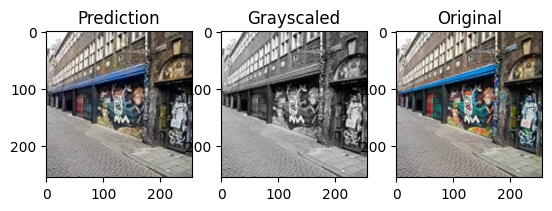

In [75]:
output_images(val_data, model, 20)

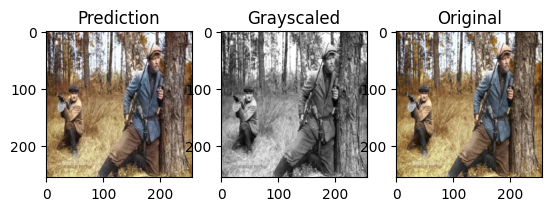

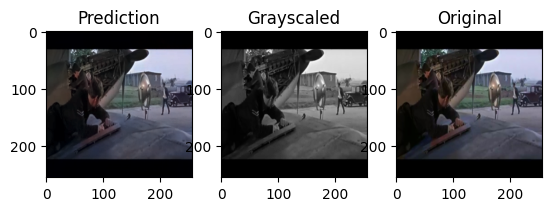

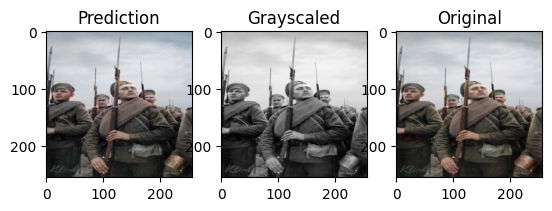

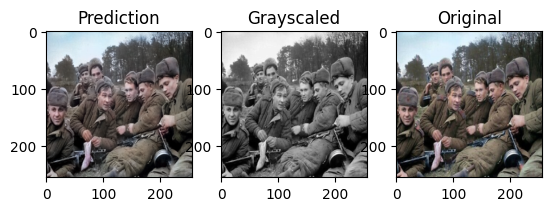

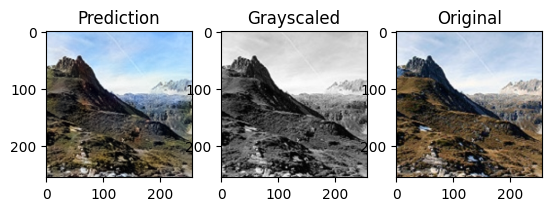

In [62]:
output_images(train_data, model, 5)

In [93]:
test_link = "/kaggle/input/testing-history-images/test_data "
test_data = CustomDataset(test_link, transformer)

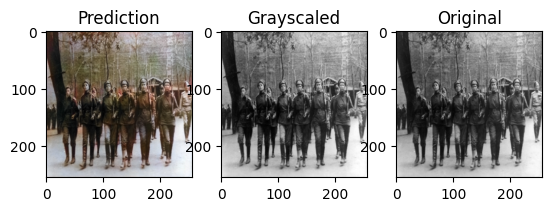

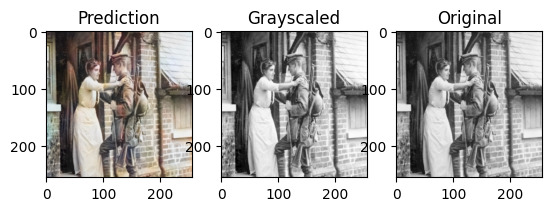

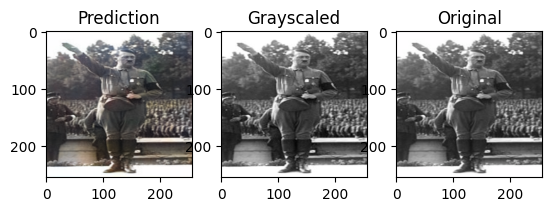

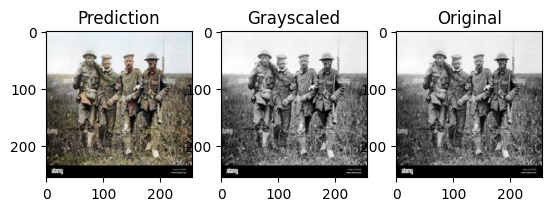

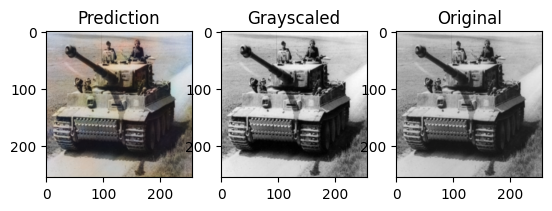

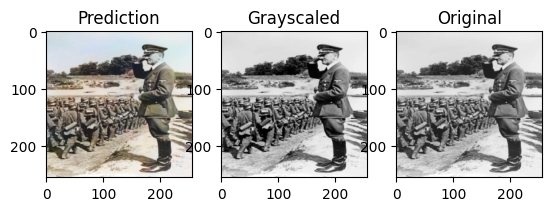

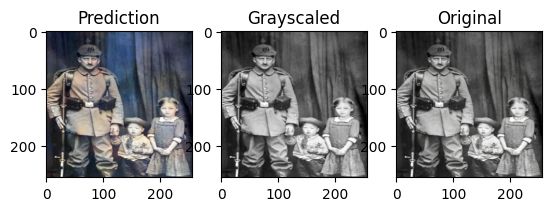

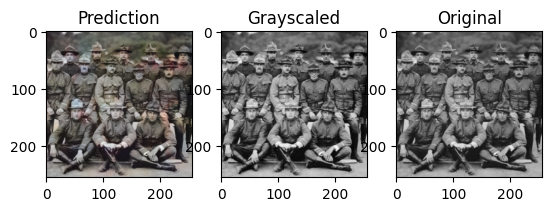

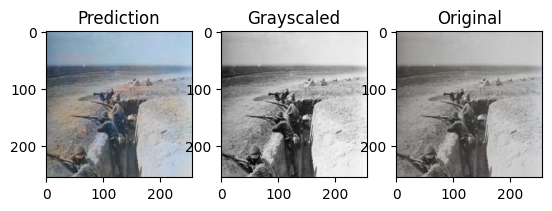

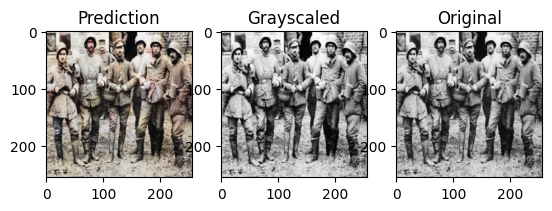

In [64]:
output_images(test_data, model, 10)

In [55]:
model.eval()
test_loss = 0.0
test_psnr = 0.0
test_ssim = 0.0

with torch.no_grad():
    for x, y in tqdm(test_data):
        x = x.to(device).unsqueeze(0)
        y = y.to(device).unsqueeze(0)
        
        preds = model(x)
        loss = loss_fn(preds, y) 
        test_loss += loss.item()

        t_psnr = psnr(preds.detach().cpu().numpy(), y.detach().cpu().numpy(), data_range=2.0)
        test_psnr += t_psnr.item()

        preds_np = preds.cpu().detach().numpy()
        y_np = y.cpu().detach().numpy()
        
        if preds_np.shape[1] > 1:  
            preds_np = preds_np.mean(axis=1) 
            y_np = y_np.mean(axis=1)
            
        t_ssim = ssim(preds_np.squeeze(), y_np.squeeze(), win_size=7, data_range=2.0)
        test_ssim += t_ssim


fin_loss = test_loss / len(test_data)
fin_psnr = test_psnr / len(test_data)
fin_ssim = test_ssim / len(test_data)

print(f"[Loss: {fin_loss:.4f}; PSNR: {fin_psnr}; SSIM: {fin_ssim}]")             

100%|██████████| 22/22 [00:00<00:00, 28.52it/s]

[Loss: 0.0025; PSNR: 32.44077677395968; SSIM: 0.43647928823227816]


In [56]:
# torch.save(model.state_dict(), "history_in_color_v09.pt")

In [31]:
class StudentModel(nn.Module):
    def __init__(self, inputs=1, outputs=2):
        super().__init__()

        self.conv1 = nn.Conv2d(inputs, 32, kernel_size=4, stride=2, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1)

        self.conv5 = nn.Conv2d(256, 512, kernel_size=4, stride=1, padding=3, dilation = 2)
        self.t_conv5 = nn.Conv2d(512, 256, kernel_size=4, stride=1, padding=3, dilation = 2)
        
        self.t_conv4 = nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1)
        self.t_conv3 = nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1)
        self.t_conv2 = nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1)
        self.t_conv1 = nn.ConvTranspose2d(32, outputs, kernel_size=4, stride=2, padding=1)

       

    def forward(self, x, return_latent=False):
        out1 = F.leaky_relu(self.conv1(x))
        # print(out1.shape)
        out2 = F.leaky_relu(self.conv2(out1))
        # print(out2.shape)
        out3 = F.leaky_relu(self.conv3(out2))
        # print(out3.shape)
        out4 = F.leaky_relu(self.conv4(out3))
        # print(out4.shape)

        out5 = F.leaky_relu(self.conv5(out4))
        # print(out5.shape)

        if return_latent == True:
            return out5
        
        out6 = F.leaky_relu(self.t_conv5(out5))
        # print(out6.shape)
        out7 = F.leaky_relu(self.t_conv4(out6))
        # print(out7.shape)
        out8 = F.leaky_relu(self.t_conv3(out7))
        # print(out8.shape)
        out9 = F.leaky_relu(self.t_conv2(out8))
        # print(out9.shape)
        out = F.tanh(self.t_conv1(out9))

        return out 

    def predict(self, l_channel):
        self.eval()

        with torch.no_grad():
            ab_channel = self.forward(l_channel)

        L = l_channel.squeeze(0).squeeze(0).cpu().numpy()
        AB = ab_channel.squeeze(0).cpu().numpy()

        A = AB[0, :, :]
        B = AB[1, :, :]

        L = np.clip(L * 100, 0, 100).astype(np.uint8)
        A = np.clip(A * 128, -128, 127).astype(np.int8)
        B = np.clip(B * 128, -128, 127).astype(np.int8)

        lab_image = np.stack([L, A, B], axis=-1).astype(np.float64)
        rgb_image = lab2rgb(lab_image)
        rgb_image = (rgb_image * 255).astype(np.uint8)

        return rgb_image



student_model = StudentModel()

In [32]:
tensor = torch.rand(1, 1, 256, 256)

res = student_model(tensor)
res.shape

torch.Size([1, 2, 256, 256])

In [33]:
tensor = torch.rand(1, 1, 256, 256).to(device)

res = student_model.predict(tensor)
res.shape

(256, 256, 3)

In [34]:
tensor = torch.rand(1, 1, 256, 256)

res = student_model(tensor, return_latent=True)
res.shape

torch.Size([1, 512, 16, 16])

In [35]:
student_model.to(device)
summary(student_model, input_size=(1, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 128, 128]             544
            Conv2d-2           [-1, 64, 64, 64]          32,832
            Conv2d-3          [-1, 128, 32, 32]         131,200
            Conv2d-4          [-1, 256, 16, 16]         524,544
            Conv2d-5          [-1, 512, 16, 16]       2,097,664
            Conv2d-6          [-1, 256, 16, 16]       2,097,408
   ConvTranspose2d-7          [-1, 128, 32, 32]         524,416
   ConvTranspose2d-8           [-1, 64, 64, 64]         131,136
   ConvTranspose2d-9         [-1, 32, 128, 128]          32,800
  ConvTranspose2d-10          [-1, 2, 256, 256]           1,026
Total params: 5,573,570
Trainable params: 5,573,570
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.25
Forward/backward pass size (MB): 17.00
Params size (MB): 21.26
Estim

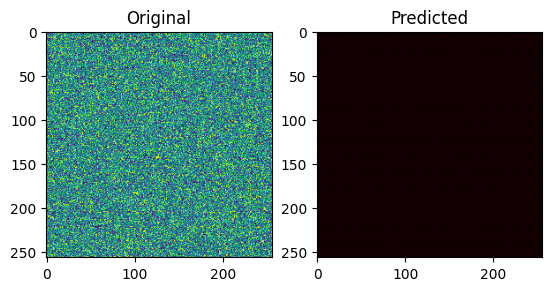

In [44]:
tensor = torch.rand(1, 1, 256, 256).to(device)
tensor = tensor.squeeze(0).permute(1, 2, 0)
tensor = tensor[:, :, 0] / 100

t_tensor = tensor.unsqueeze(2).cpu().numpy()
tensor = tensor.unsqueeze(0).unsqueeze(0)

res = student_model.predict(tensor)

plt.subplot(1, 2, 1)
plt.imshow(t_tensor)
plt.title("Original")

plt.subplot(1, 2, 2)
plt.imshow(res)
plt.title("Predicted")

plt.show()

In [46]:
def distillation_train(train_dl, val_dl, student_model, teacher_model, loss_fn, dist_fn, psnr, ssim, optimizer, 
                       epochs, device, alpha=0.5, beta=0.5):

    data = pd.DataFrame(columns=["Epochs", "Train Loss", "Train PSNR", "Train SSIM", "Val Loss", "Val PSNR", "Val SSIM"])
    history = {
        "train_loss": [],
        "train_psnr": [],
        "train_ssim": [],

        "val_loss": [],
        "val_psnr": [],
        "val_ssim": []
    }

    for epoch in range(epochs):

        student_model.train()
        teacher_model.eval()

        train_loss = 0.0
        train_psnr = 0.0
        train_ssim = 0.0

        for x, y in tqdm(train_dl):
            x = x.to(device)
            y = y.to(device)

            optimizer.zero_grad()

            with torch.no_grad():
                teacher_latent = teacher_model(x, return_latent=True)

            student_preds = student_model(x, return_latent=False)
            student_latent = student_model(x, return_latent=True)

            reconstruction_loss = loss_fn(student_preds, y)
            distillation_loss = dist_fn(teacher_latent, student_latent)

            loss = alpha * reconstruction_loss + beta * distillation_loss
            train_loss += loss.item()

            loss.backward()
            optimizer.step()

            t_psnr = psnr(student_preds.detach().cpu().numpy(), y.detach().cpu().numpy(), data_range=2.0)
            train_psnr += t_psnr.item()

            preds_np = student_preds.cpu().detach().numpy()
            y_np = y.cpu().detach().numpy()

            if preds_np.shape[1] > 1:  
                preds_np = preds_np.mean(axis=1) 
                y_np = y_np.mean(axis=1)

            t_ssim = ssim(preds_np.squeeze(), y_np.squeeze(), win_size=7, data_range=2.0)
            train_ssim += t_ssim


        total_train_loss = train_loss / len(train_dl)
        total_train_psnr = train_psnr / len(train_dl)
        total_train_ssim = train_ssim / len(train_dl)

        student_model.eval()
        val_loss = 0.0
        val_psnr = 0.0
        val_ssim = 0.0

        for x, y in tqdm(val_dl):
            x = x.to(device)
            y = y.to(device)

            with torch.no_grad():
                preds = student_model(x)

            loss = loss_fn(preds, y)
            val_loss += loss.item()

            t_psnr = psnr(preds.detach().cpu().numpy(), y.detach().cpu().numpy(), data_range=2.0)
            val_psnr += t_psnr.item()

            preds_np = preds.cpu().detach().numpy()
            y_np = y.cpu().detach().numpy()

            if preds_np.shape[1] > 1:  
                preds_np = preds_np.mean(axis=1) 
                y_np = y_np.mean(axis=1)

            t_ssim = ssim(preds_np.squeeze(), y_np.squeeze(), win_size=7, data_range=2.0)
            val_ssim += t_ssim

        total_val_loss = val_loss / len(val_dl)
        total_val_psnr = val_psnr / len(val_dl)
        total_val_ssim = val_ssim / len(val_dl)

        history["train_loss"].append(total_train_loss)
        history["train_psnr"].append(total_train_psnr)
        history["train_ssim"].append(total_train_ssim)

        history["val_loss"].append(total_val_loss)
        history["val_psnr"].append(total_val_psnr)
        history["val_ssim"].append(total_val_ssim)

        data.loc[epoch] = [int(epoch+1), round(total_train_loss, 4), round(total_train_psnr, 4), round(total_train_ssim, 4), round(total_val_loss, 4), round(total_val_psnr, 4), round(total_val_ssim, 4)]
        data["Epochs"] = data["Epochs"].astype(int)
        
        print(f"Epoch: {epoch+1}; train_loss: {total_train_loss:.4f}; train_psnr: {total_train_psnr:.4f}, train_ssim: {total_train_ssim:.4f}; val_loss: {total_val_loss:.4f}; val_psnr: {total_val_psnr:.4f}; val_ssim: {total_val_ssim:.4f}")

    current_time = datetime.now()
    time_name = current_time.strftime("%Y-%m-%d_%H:%M")
    data.to_csv(f"ex_{time_name}.csv")

    return history 
        
            
            
            

            
                
    

In [47]:
teacher_model = model
student_model = StudentModel()

teacher_model.to(device)
student_model.to(device)

StudentModel(
  (conv1): Conv2d(1, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (conv4): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (conv5): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(3, 3), dilation=(2, 2))
  (t_conv5): Conv2d(512, 256, kernel_size=(4, 4), stride=(1, 1), padding=(3, 3), dilation=(2, 2))
  (t_conv4): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (t_conv3): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (t_conv2): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (t_conv1): ConvTranspose2d(32, 2, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
)

In [48]:
tensor = torch.rand(1, 1, 256, 256).to(device)

res = student_model(tensor, return_latent=True)
res.shape

torch.Size([1, 512, 16, 16])

In [49]:
tensor = torch.rand(1, 1, 256, 256).to(device)

res = teacher_model(tensor, return_latent=True)
res.shape

torch.Size([1, 512, 16, 16])

In [50]:
loss_fn = nn.MSELoss()
dist_fn = nn.MSELoss()

optimizer = Adam(student_model.parameters(), lr=1e-3)

In [51]:
history = distillation_train(train_dl, val_dl, student_model, teacher_model, loss_fn, dist_fn, psnr, ssim, optimizer, 
                       40, device, alpha=0.5, beta=0.5)

100%|██████████| 20/20 [00:35<00:00,  1.77s/it]


Epoch: 1; train_loss: 0.0183; train_psnr: 28.1171, train_ssim: 0.4918; val_loss: 0.0055; val_psnr: 28.6573; val_ssim: 0.5152


100%|██████████| 20/20 [00:35<00:00,  1.78s/it]


Epoch: 2; train_loss: 0.0130; train_psnr: 29.1929, train_ssim: 0.5870; val_loss: 0.0045; val_psnr: 29.5489; val_ssim: 0.6156


100%|██████████| 20/20 [00:35<00:00,  1.78s/it]


Epoch: 3; train_loss: 0.0107; train_psnr: 29.8778, train_ssim: 0.6412; val_loss: 0.0038; val_psnr: 30.2424; val_ssim: 0.6756


100%|██████████| 20/20 [00:34<00:00,  1.75s/it]


Epoch: 4; train_loss: 0.0093; train_psnr: 30.6609, train_ssim: 0.6945; val_loss: 0.0034; val_psnr: 30.8003; val_ssim: 0.6921


100%|██████████| 20/20 [00:35<00:00,  1.78s/it]


Epoch: 5; train_loss: 0.0084; train_psnr: 31.2373, train_ssim: 0.7250; val_loss: 0.0031; val_psnr: 31.1755; val_ssim: 0.7173


100%|██████████| 20/20 [00:35<00:00,  1.79s/it]


Epoch: 6; train_loss: 0.0080; train_psnr: 31.6189, train_ssim: 0.7478; val_loss: 0.0029; val_psnr: 31.4173; val_ssim: 0.7576


100%|██████████| 20/20 [00:35<00:00,  1.75s/it]


Epoch: 7; train_loss: 0.0074; train_psnr: 32.1084, train_ssim: 0.7735; val_loss: 0.0029; val_psnr: 31.4520; val_ssim: 0.7574


100%|██████████| 20/20 [00:36<00:00,  1.81s/it]


Epoch: 8; train_loss: 0.0070; train_psnr: 32.5545, train_ssim: 0.7905; val_loss: 0.0025; val_psnr: 32.1425; val_ssim: 0.7773


100%|██████████| 20/20 [00:35<00:00,  1.79s/it]


Epoch: 9; train_loss: 0.0067; train_psnr: 32.9062, train_ssim: 0.8053; val_loss: 0.0024; val_psnr: 32.2714; val_ssim: 0.7803


100%|██████████| 20/20 [00:33<00:00,  1.70s/it]


Epoch: 10; train_loss: 0.0063; train_psnr: 33.3373, train_ssim: 0.8221; val_loss: 0.0025; val_psnr: 32.1388; val_ssim: 0.7319


100%|██████████| 20/20 [00:36<00:00,  1.83s/it]


Epoch: 11; train_loss: 0.0061; train_psnr: 33.5790, train_ssim: 0.8307; val_loss: 0.0023; val_psnr: 32.5714; val_ssim: 0.7947


100%|██████████| 20/20 [00:36<00:00,  1.81s/it]


Epoch: 12; train_loss: 0.0059; train_psnr: 33.8378, train_ssim: 0.8383; val_loss: 0.0023; val_psnr: 32.4419; val_ssim: 0.8028


100%|██████████| 20/20 [00:35<00:00,  1.76s/it]


Epoch: 13; train_loss: 0.0057; train_psnr: 34.2092, train_ssim: 0.8533; val_loss: 0.0022; val_psnr: 32.7115; val_ssim: 0.7949


100%|██████████| 20/20 [00:35<00:00,  1.79s/it]


Epoch: 14; train_loss: 0.0055; train_psnr: 34.4679, train_ssim: 0.8617; val_loss: 0.0021; val_psnr: 32.8279; val_ssim: 0.8112


100%|██████████| 20/20 [00:35<00:00,  1.79s/it]


Epoch: 15; train_loss: 0.0054; train_psnr: 34.6971, train_ssim: 0.8671; val_loss: 0.0020; val_psnr: 33.0413; val_ssim: 0.8203


100%|██████████| 20/20 [00:35<00:00,  1.80s/it]


Epoch: 16; train_loss: 0.0052; train_psnr: 34.9440, train_ssim: 0.8747; val_loss: 0.0021; val_psnr: 32.9128; val_ssim: 0.8226


100%|██████████| 20/20 [00:36<00:00,  1.80s/it]


Epoch: 17; train_loss: 0.0051; train_psnr: 35.1427, train_ssim: 0.8819; val_loss: 0.0020; val_psnr: 33.1602; val_ssim: 0.8277


100%|██████████| 20/20 [00:34<00:00,  1.75s/it]


Epoch: 18; train_loss: 0.0050; train_psnr: 35.2456, train_ssim: 0.8837; val_loss: 0.0019; val_psnr: 33.3147; val_ssim: 0.8248


100%|██████████| 20/20 [00:35<00:00,  1.75s/it]


Epoch: 19; train_loss: 0.0049; train_psnr: 35.4351, train_ssim: 0.8878; val_loss: 0.0019; val_psnr: 33.3212; val_ssim: 0.8323


100%|██████████| 20/20 [00:35<00:00,  1.79s/it]


Epoch: 20; train_loss: 0.0048; train_psnr: 35.5458, train_ssim: 0.8904; val_loss: 0.0020; val_psnr: 33.1576; val_ssim: 0.8332


100%|██████████| 20/20 [00:35<00:00,  1.76s/it]


Epoch: 21; train_loss: 0.0048; train_psnr: 35.7624, train_ssim: 0.8982; val_loss: 0.0018; val_psnr: 33.5391; val_ssim: 0.8373


100%|██████████| 20/20 [00:35<00:00,  1.78s/it]


Epoch: 22; train_loss: 0.0047; train_psnr: 35.9475, train_ssim: 0.9038; val_loss: 0.0019; val_psnr: 33.2537; val_ssim: 0.8340


100%|██████████| 20/20 [00:36<00:00,  1.82s/it]


Epoch: 23; train_loss: 0.0046; train_psnr: 35.9416, train_ssim: 0.9026; val_loss: 0.0019; val_psnr: 33.3346; val_ssim: 0.8343


100%|██████████| 20/20 [00:35<00:00,  1.76s/it]


Epoch: 24; train_loss: 0.0046; train_psnr: 36.0931, train_ssim: 0.9058; val_loss: 0.0019; val_psnr: 33.3951; val_ssim: 0.8366


100%|██████████| 20/20 [00:35<00:00,  1.78s/it]


Epoch: 25; train_loss: 0.0045; train_psnr: 36.1701, train_ssim: 0.9077; val_loss: 0.0018; val_psnr: 33.5870; val_ssim: 0.8487


100%|██████████| 20/20 [00:34<00:00,  1.73s/it]


Epoch: 26; train_loss: 0.0045; train_psnr: 36.2706, train_ssim: 0.9113; val_loss: 0.0018; val_psnr: 33.7101; val_ssim: 0.8449


100%|██████████| 20/20 [00:35<00:00,  1.76s/it]


Epoch: 27; train_loss: 0.0044; train_psnr: 36.3978, train_ssim: 0.9117; val_loss: 0.0018; val_psnr: 33.6581; val_ssim: 0.8493


100%|██████████| 20/20 [00:35<00:00,  1.76s/it]


Epoch: 28; train_loss: 0.0043; train_psnr: 36.4663, train_ssim: 0.9144; val_loss: 0.0018; val_psnr: 33.6456; val_ssim: 0.8345


100%|██████████| 20/20 [00:38<00:00,  1.92s/it]


Epoch: 29; train_loss: 0.0043; train_psnr: 36.5826, train_ssim: 0.9183; val_loss: 0.0018; val_psnr: 33.6099; val_ssim: 0.8390


100%|██████████| 20/20 [00:35<00:00,  1.80s/it]


Epoch: 30; train_loss: 0.0043; train_psnr: 36.5692, train_ssim: 0.9181; val_loss: 0.0018; val_psnr: 33.6222; val_ssim: 0.8430


100%|██████████| 20/20 [00:35<00:00,  1.79s/it]


Epoch: 31; train_loss: 0.0042; train_psnr: 36.7231, train_ssim: 0.9191; val_loss: 0.0018; val_psnr: 33.5869; val_ssim: 0.8491


100%|██████████| 20/20 [00:35<00:00,  1.77s/it]


Epoch: 32; train_loss: 0.0042; train_psnr: 36.8118, train_ssim: 0.9206; val_loss: 0.0017; val_psnr: 33.7275; val_ssim: 0.8504


100%|██████████| 20/20 [00:35<00:00,  1.77s/it]


Epoch: 33; train_loss: 0.0041; train_psnr: 36.8868, train_ssim: 0.9245; val_loss: 0.0017; val_psnr: 33.7919; val_ssim: 0.8512


100%|██████████| 20/20 [00:36<00:00,  1.81s/it]


Epoch: 34; train_loss: 0.0041; train_psnr: 36.8929, train_ssim: 0.9226; val_loss: 0.0017; val_psnr: 33.7914; val_ssim: 0.8525


100%|██████████| 20/20 [00:36<00:00,  1.80s/it]


Epoch: 35; train_loss: 0.0041; train_psnr: 37.0088, train_ssim: 0.9248; val_loss: 0.0018; val_psnr: 33.6295; val_ssim: 0.8510


100%|██████████| 20/20 [00:36<00:00,  1.81s/it]


Epoch: 36; train_loss: 0.0041; train_psnr: 36.9045, train_ssim: 0.9238; val_loss: 0.0017; val_psnr: 33.8171; val_ssim: 0.8564


100%|██████████| 20/20 [00:35<00:00,  1.80s/it]


Epoch: 37; train_loss: 0.0040; train_psnr: 37.0531, train_ssim: 0.9276; val_loss: 0.0017; val_psnr: 33.7511; val_ssim: 0.8531


100%|██████████| 20/20 [00:36<00:00,  1.80s/it]


Epoch: 38; train_loss: 0.0040; train_psnr: 37.1687, train_ssim: 0.9286; val_loss: 0.0017; val_psnr: 33.8859; val_ssim: 0.8590


100%|██████████| 20/20 [00:35<00:00,  1.77s/it]


Epoch: 39; train_loss: 0.0040; train_psnr: 37.1815, train_ssim: 0.9298; val_loss: 0.0017; val_psnr: 33.8517; val_ssim: 0.8558


100%|██████████| 20/20 [00:35<00:00,  1.76s/it]

Epoch: 40; train_loss: 0.0039; train_psnr: 37.2281, train_ssim: 0.9305; val_loss: 0.0017; val_psnr: 33.9476; val_ssim: 0.8637


In [53]:
torch.save(student_model.state_dict(), "history_in_color_v10.pt")

In [ ]:


student_model.load_state_dict(torch.load("/kaggle/input/weights-6/history_in_color_v06.pt"))
student_model.to(device)

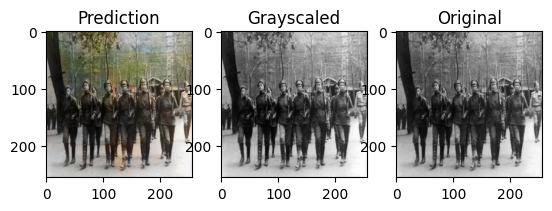

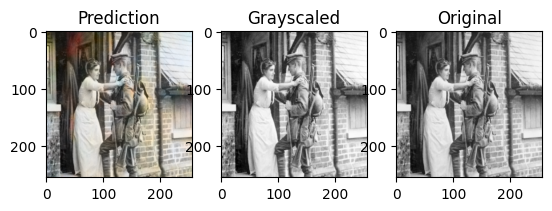

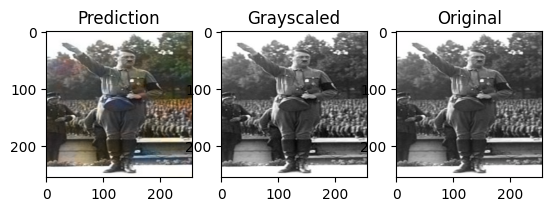

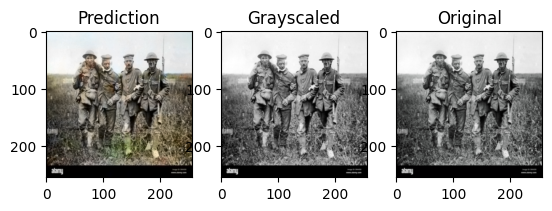

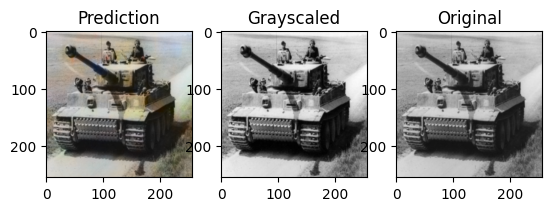

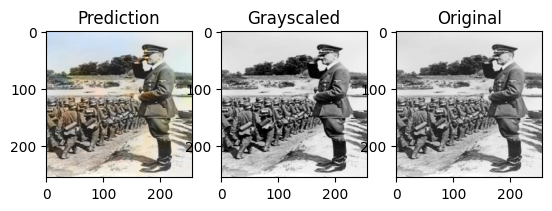

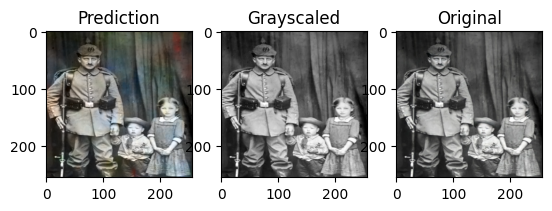

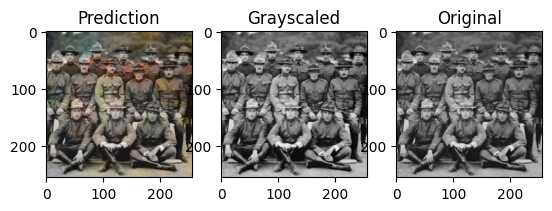

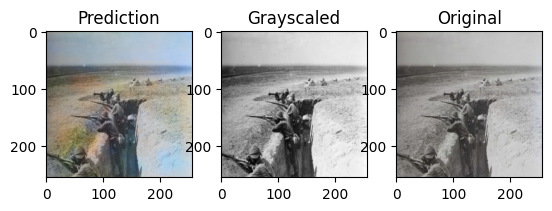

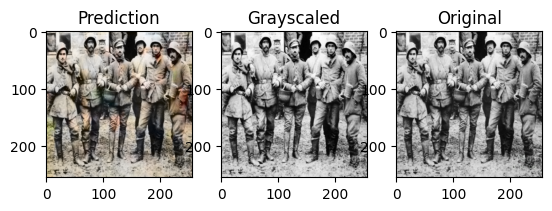

In [76]:
# student_model.to(device)
output_images(test_data, student_model, 10)

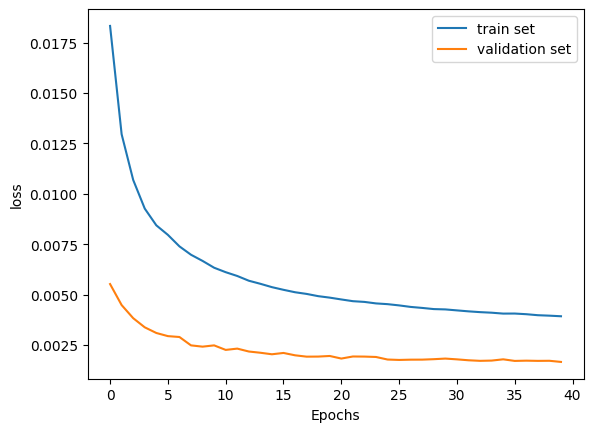

In [84]:
output(history, "loss")

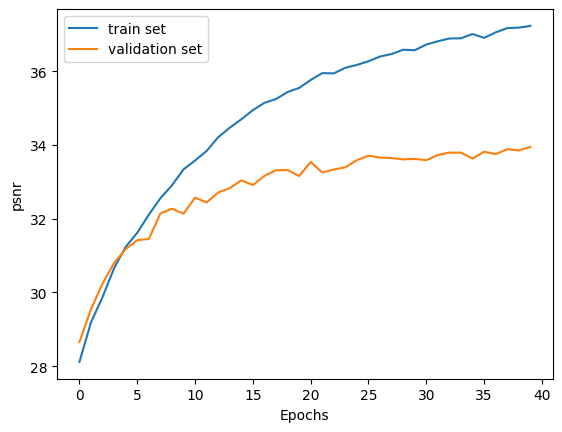

In [85]:
output(history, "psnr")

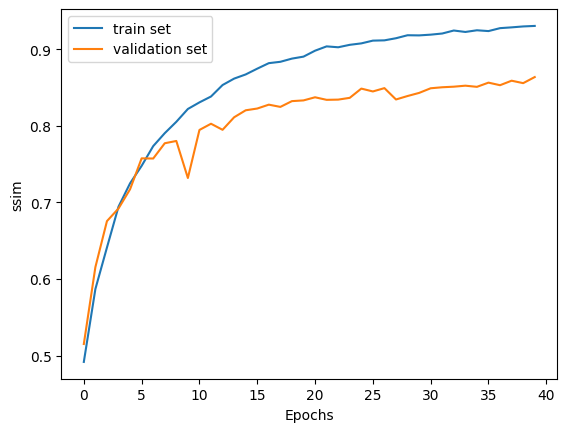

In [86]:
output(history, "ssim")

In [100]:
test_loss = 0.0
test_psnr = 0.0
test_ssim = 0.0

student_model.eval()
with torch.no_grad():
    for x, y in tqdm(test_data):
        x = x.to(device).unsqueeze(0)
        y = y.to(device).unsqueeze(0)

        preds = student_model(x)
        loss = loss_fn(preds, y)
        test_loss += loss.item()

        t_psnr = psnr(preds.detach().cpu().numpy(), y.detach().cpu().numpy(), data_range=2.0)
        test_psnr += t_psnr.item()

        preds_np = preds.cpu().detach().numpy()
        y_np = y.cpu().detach().numpy()
        
        if preds_np.shape[1] > 1:  
            preds_np = preds_np.mean(axis=1) 
            y_np = y_np.mean(axis=1)
            
        t_ssim = ssim(preds_np.squeeze(), y_np.squeeze(), win_size=7, data_range=2.0)
        test_ssim += t_ssim
        
fin_loss = test_loss / len(test_data)
fin_psnr = test_psnr / len(test_data)
fin_ssim = test_ssim / len(test_data)

print(f"[Loss: {fin_loss:.4f}; PSNR: {fin_psnr:.4f}; SSIM: {fin_ssim:.4f}]")

        
        


100%|██████████| 22/22 [00:00<00:00, 33.74it/s]

[Loss: 0.0032; PSNR: 31.5039; SSIM: 0.4494]


In [ ]:
def test(model, test_dl):

    test_loss = 0.0
    test_psnr = 0.0
    test_ssim = 0.0

    model.eval()
    with torch.no_grad():
        for x, y, z in tqdm(test_dl):
            x = x.to(device)
            y = y.to(device)
            z = z.to(device)

            preds = model(x, z)
            loss = loss_fn(preds, y)
            test_loss += loss.item()

            t_psnr = psnr(preds.detach().cpu().numpy(), y.detach().cpu().numpy(), data_range=2.0)
            test_psnr += t_psnr.item()

            preds_np = preds.cpu().detach().numpy()
            y_np = y.cpu().detach().numpy()

            ssim = []
            for i in range(preds_np.size(0)):
                pred = preds_np[i]
                y = y_np[i]
                t_ssim = ssim(pred.squeeze(), y.squeeze(0), win_size=7, data_range=2.0, axis_channel = 0)
                ssim.append(t_ssim)
            ssim = np.mean(ssim)
            test_ssim += ssim




        ...

In [36]:
student_model = StudentModel()

student_model.load_state_dict(torch.load("/kaggle/input/weight-10/colorizer_s.pt",  map_location=device))
# t_model.to(device)

<ipython-input-36-965908e1a209>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  student_model.load_state_dict(torch.load("/kaggle/input/weight-10/colorizer_s.pt",  map_loca

<All keys matched successfully>

In [ ]:
student_model.to(device)
test(student_model, test_data, 10)

In [42]:
def predict_image(link, transformer, model):
    image = Image.open(link).convert("RGB")
    image = transformer(image)
    
    image = image.permute(1, 2, 0).cpu().numpy()
    image = rgb2lab(image)
    L = image[:, :, 0] / 100.0
    
    L = torch.tensor(L, dtype=torch.float32)
    l = L.unsqueeze(2)
    L = L.unsqueeze(0).unsqueeze(0)
    
    res = student_model.predict(L)
    
    plt.figure(figsize=(10, 6))
    
    plt.subplot(1, 2, 1)
    plt.imshow(res)
    plt.axis("off")
    
    plt.subplot(1, 2, 2)
    plt.imshow(l, cmap="gray")
    plt.axis("off")
    
    plt.show()

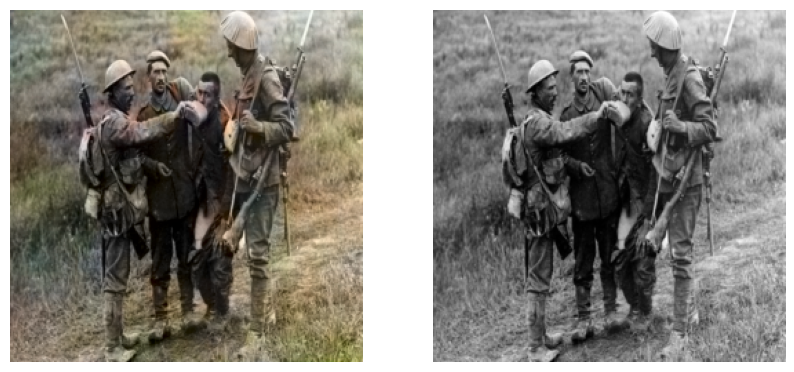

In [43]:
link = "/kaggle/input/testing-history-images/test_data /2_image.jpg"
predict_image(link, transformer, student_model)